In [1]:
import vmlab
import igraph as ig
import pandas as pd
import matplotlib.pyplot as plt
from importlib import resources, reload
# import vmlab.processes as printernal
# _ = reload(printernal)
import numpy as np
from scipy.sparse import csgraph


reloaded


# Essais module carbon_flow_coeff 

In [2]:
## Données
with resources.path('vmlab.data.trees', 'scaffold_E13_320.csv') as path:
    tree = pd.read_csv(path)
    graph = vmlab.to_graph(tree)

max_distance_to_fruit = 10

FileNotFoundError: [Errno 2] No such file or directory: 'd:\\mes programmes\\vmango-lab\\vmlab\\data\\trees\\scaffold_E13_320.csv'

In [30]:
## Initialisation
distance_to_fruit = np.array([], dtype=np.float32)
is_in_distance_to_fruit = np.array([], dtype=bool)

distances = np.full((len(tree['id']),len(tree['id'])), np.inf, dtype=np.float32)
adjacency= np.array(graph.get_adjacency())

In [31]:
is_fruting = tree['arch_dev__pot_nb_fruit']>0
np.flatnonzero(is_fruting)

array([16, 18, 22, 24, 33, 40, 46, 55], dtype=int64)

In [32]:
is_leafy = (tree['growth__nb_leaf'] > 0.)
np.flatnonzero(is_leafy)

array([11, 12, 16, 17, 18, 19, 20, 21, 22, 26, 27, 31, 32, 33, 39, 42, 45,
       46, 51, 52, 53, 54, 62, 63, 67, 69, 72, 75, 76, 77, 78],
      dtype=int64)

In [33]:
distance_to_fruit = csgraph.shortest_path( 
                    adjacency,
                    indices=np.flatnonzero(is_fruting),
                    directed=False
                ).astype(np.float32)

 #pour chaque fruit, calcule la plus courte distance avec chacun des 79 UC de l'arbre

In [34]:
distances[:] = np.inf #quel but ?? semble avoir raccourci le tableau

In [35]:
distance_to_fruit[distance_to_fruit > max_distance_to_fruit] = np.inf #supprime les UC à une trop grande distance du fruit (d max fixée au début)

In [36]:
distances[np.flatnonzero(is_fruting), :] = distance_to_fruit # toutes les UC de l'arbre

In [37]:
distance_to_fruit[:, np.flatnonzero(~is_leafy)] = np.inf #note inf les UC ne portant pas de feuilles (~ probalement)

In [38]:
is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32) #1 si la valeur est finie, 0 sinon
 # donc 1 équivalent à "l'UC fournit du carbone au fruit"

In [39]:
sum_is_in_distance_to_fruit = np.nansum(is_in_distance_to_fruit, axis=0)

In [40]:
is_in_distance_to_fruit[is_in_distance_to_fruit == 0.] = np.nan #remplace les 0 par des NA

In [41]:
sum_is_in_distance_to_fruit = np.nansum(is_in_distance_to_fruit, axis=0)
 #nombre de fruits pour lesquels l'UC fournit du carbone

In [42]:
distances[np.flatnonzero(is_fruting), :] = distance_to_fruit 

# Essais module light interception

In [3]:
with resources.path('vmlab.data.trees', 'tree_E13_leaf_completed.csv') as path:
    tree = pd.read_csv(path)
    graph = vmlab.to_graph(tree)

In [4]:
with resources.path('vmlab.data.environment', 'hour_sunlit_fractions_E13.csv') as sunlit_fractions_E13_file_path:
    sunlit_fraction_df = pd.read_csv(
            sunlit_fractions_E13_file_path,
            sep='\\s+',
            #usecols=['q5', 'q10', 'q25', 'q50', 'q75', 'q90', 'q95']
            usecols=["E13_09A", "E13_09B", "E13_09D", "E13_09E", "E13_09F", "E13_09H", "E13_09I", "E13_09J", "E13_09L", "E13_14H", "E13_14I", "E13_18B", "E13_18C", "E13_18D", "E13_18E", "E13_18F", "E13_18G", "E13_18H", "E13_18I", "E13_18J", "E13_18K", "E13_19I", "E13_19J", "E13_19K", "E13_19L", "E13_19M", "E13_19N", "E13_23E", "E13_23J", "E13_23K", "E13_23M", "E13_24A", "E13_24B", "E13_24C", "E13_24D", "E13_24E", "E13_24F", "E13_24G", "E13_24H", "E13_24I", "E13_24L", "E13_25A", "E13_25B", "E13_25C", "E13_25D", "E13_25E", "E13_25F", "E13_25G", "E13_26A", "E13_26B", "E13_27A", "E13_27B", "E13_27C", "E13_27D", "E13_27E", "E13_27F", "E13_27G", "E13_27H", "E13_28A", "E13_28B", "E13_28C", "E13_28D", "E13_28E", "E13_28F", "E13_28G", "E13_28H", "E13_28I", "E13_32C", "E13_32D", "E13_32E", "E13_32F", "E13_32G", "E13_32H", "E13_32J", "E13_34A", "E13_34B", "E13_34C", "E13_34D", "E13_34E", "E13_34F", "E13_36S", "E13_37A", "E13_37B", "E13_37C", "E13_37D", "E13_37E", "E13_37F", "E13_37G", "E13_37H", "E13_37J", "E13_37K", "E13_37L", "E13_37M", "E13_37O", "E13_37P", "E13_37Q", "E13_37R", "E13_37S", "E13_37T", "E13_37U", "E13_37V", "E13_37W", "E13_37X", "E13_01A", "E13_01B", "E13_01C", "E13_01D", "E13_01E", "E13_01F", "E13_01G", "E13_01H", "E13_01I", "E13_02A", "E13_02B", "E13_02C", "E13_02D", "E13_02E", "E13_02F", "E13_04A", "E13_04B", "E13_04C", "E13_04D", "E13_04E", "E13_04F", "E13_04G", "E13_06A", "E13_06B", "E13_06C", "E13_06D", "E13_06E", "E13_06F", "E13_06G", "E13_06H", "E13_06I", "E13_06J", "E13_06K", "E13_06L", "E13_06M", "E13_06N", "E13_06O", "E13_06P", "E13_06Q", "E13_06R", "E13_08A", "E13_08B", "E13_08C", "E13_08D", "E13_08E", "E13_08F", "E13_08G", "E13_08H", "E13_08I", "E13_08J", "E13_08K", "E13_09C", "E13_09G", "E13_09K", "E13_10A", "E13_10B", "E13_10C", "E13_10D", "E13_11A", "E13_11B", "E13_11C", "E13_11D", "E13_11E", "E13_11F", "E13_11G", "E13_11H", "E13_11I", "E13_11J", "E13_12A", "E13_12B", "E13_12C", "E13_12D", "E13_12E", "E13_12F", "E13_12G", "E13_13A", "E13_13B", "E13_13C", "E13_13D", "E13_13E", "E13_14A", "E13_14B", "E13_14C", "E13_14D", "E13_14E", "E13_14F", "E13_14G", "E13_14J", "E13_14K", "E13_14L", "E13_14M", "E13_16A", "E13_16B", "E13_16C", "E13_16D", "E13_16E", "E13_16F", "E13_16G", "E13_16H", "E13_16I", "E13_18A", "E13_19A", "E13_19B", "E13_19C", "E13_19D", "E13_19F", "E13_19G", "E13_19H", "E13_20A", "E13_20B", "E13_20C", "E13_20D", "E13_20E", "E13_22A", "E13_22B", "E13_22C", "E13_23A", "E13_23B", "E13_23C", "E13_23D", "E13_30A", "E13_30B", "E13_30C", "E13_30D", "E13_30E", "E13_30F", "E13_30G", "E13_30H", "E13_30I", "E13_30J", "E13_30K", "E13_31A", "E13_31B", "E13_31C", "E13_31D", "E13_31E", "E13_31F", "E13_31G", "E13_32A", "E13_32B", "E13_32I", "E13_33A", "E13_33B", "E13_33C", "E13_33D", "E13_33E", "E13_33F", "E13_33G", "E13_33H", "E13_33I", "E13_33J", "E13_33K", "E13_33L", "E13_33M", "E13_33N", "E13_33O", "E13_33P", "E13_33Q", "E13_33R", "E13_33S", "E13_33T", "E13_35A", "E13_35B", "E13_35C", "E13_35D", "E13_35E", "E13_35F", "E13_35G", "E13_35H", "E13_35I", "E13_35J", "E13_35K", "E13_35L", "E13_35M", "E13_35O", "E13_35P", "E13_35Q", "E13_35R", "E13_35S", "E13_35T", "E13_35U", "E13_35V", "E13_35W", "E13_35X", "E13_36A", "E13_36B", "E13_36C", "mean_sunlit"]
            )

In [18]:
sunlit_fraction_df

,E13_09A,E13_09B,E13_09D,E13_09E,E13_09F,E13_09H,E13_09I,E13_09J,E13_09L,E13_14H,...,E13_35S,E13_35T,E13_35U,E13_35V,E13_35W,E13_35X,E13_36A,E13_36B,E13_36C,mean_sunlit
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.002750,0.000000,0.000000,0.011167,0.000000,0.005583,0.008333,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005583,0.005583,0.000000,0.001758
8,0.266667,0.480583,0.333250,0.441667,0.491667,0.022167,0.263917,0.486083,0.133417,0.024917,...,0.069500,0.008333,0.091667,0.002750,0.047167,0.252833,0.111167,0.197250,0.069500,0.132788
9,0.902833,0.930583,0.911167,0.930583,0.933333,0.652750,0.833250,0.930583,0.769417,0.180417,...,0.619333,0.083333,0.094417,0.000000,0.133250,0.538750,0.139000,0.330583,0.086083,0.282375


In [5]:
nb_gu = graph.ecount()
GR = 0
nb_leaf = tree['growth__nb_leaf']

In [6]:
sunlit_fraction_col_default = pd.DataFrame(np.full(fill_value="mean_sunlit", shape = len(tree["environment_id"])))
sunlit_fraction_col_default

,0
0,mean_sunlit
1,mean_sunlit
2,mean_sunlit
3,mean_sunlit
4,mean_sunlit
...,...
1693,mean_sunlit
1694,mean_sunlit
1695,mean_sunlit
1696,mean_sunlit


In [7]:
sunlit_fraction_col = pd.DataFrame(tree["environment_id"])
sunlit_fraction_col

,environment_id
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
1693,NaN
1694,NaN
1695,NaN
1696,NaN


In [8]:
sunlit_fraction_col[pd.isna(sunlit_fraction_col)] = "mean_sunlit"
sunlit_fraction_col

#sunlitfraction doit contenir des float (car utilise np.nan), pas des string
# changement pour panda ici

,environment_id
0,mean_sunlit
1,mean_sunlit
2,mean_sunlit
3,mean_sunlit
4,mean_sunlit
...,...
1693,mean_sunlit
1694,mean_sunlit
1695,mean_sunlit
1696,mean_sunlit


In [17]:
sunlit_fraction = sunlit_fraction_df.loc[:, "mean_sunlit"].to_numpy(dtype=np.float32).T


# le format iloc sélectionne une colonne ici donc "sunlit_fraction_col" doit permettre de choisir une colonne ...
# "iloc" : si col contient des entiers ; "loc" sir col contient des mots

In [10]:
LA = np.zeros(nb_gu, dtype=np.float32)
LA_sunlit = np.zeros(nb_gu, dtype=np.float32)
LA_shaded = np.zeros(nb_gu, dtype=np.float32)

In [12]:
#ne tourne que si des valeurs nan
if np.any(pd.isna(sunlit_fraction_col)):
            # initialization of appearing GUs
            nan_sunlit_fractions = np.flatnonzero(np.isnan(sunlit_fraction_col))
            sunlit_fraction_col[nan_sunlit_fractions] = sunlit_fraction_col_default
            sunlit_fraction[nan_sunlit_fractions, :] =sunlit_fraction_df.iloc[:,sunlit_fraction_col[nan_sunlit_fractions]].to_numpy(dtype=np.float32).T

In [13]:
k_1 = 0.5                       # fraction of global radiation photosynthetically active [dimensionless]
k_2 = 4.6                       # conversion factor of global radiation (from W m-2 to µmol photon m-2 s-1) [µmol photon W-1 s-1]
k_3 = 0.0529                    # fraction of radiation received by shaded leaves [dimensionless]

sunlit_ws = 0.88                # whithin-shoots sunlit fractions of leaves (i.e not shaded by surrounding shoots) [dimensionless]

e_nleaf2LA_1 = 0.0051           # specific parameter for leaf area calculation [m2-0.937]
e_nleaf2LA_2 = 0.937            # specific parameter for leaf area calculation [dimensionless]

In [14]:
GR =GR / 3600 * 10000

# photosynthetic active radiation (eq.10-19) :
PAR = GR * k_1 * k_2
PAR_shaded = k_3 * PAR

In [15]:
# leaf area (eq. 11) :
LA = e_nleaf2LA_1 * nb_leaf ** e_nleaf2LA_2

In [18]:
# pour chaque GU, surface LA exposée au soleil (en m² ?) pour chacune des catégories
LA_sunlit = sunlit_fraction * sunlit_ws * np.vstack(LA)
LA_shaded = np.vstack(LA) - LA_sunlit

In [22]:
# [numéro d'UC, heure de la journée]
LA_shaded[1240,12], LA_sunlit[1240,12]

(0.032674886350804094, 0.015559318343558852)

# Get variables for explaining fruit growth

To understand until which distance the fruits draw their carbon within the tree, some variables related to fruit growth are collected along the tree at several distances from the fruit. While connecting these variables to fruit masses, we hope to understand which of the distances have the most influence on the final fresh mass of the fruit.

### Data

One dmax value is chosen for the whole notebook ; it is the number of distances for which the functions are applied.

In [3]:
dmax = 10

Sunlight fractions : computed from fisheye pictures of the GUs environments on the tree. The mean value on the fruting seanson is used here (to get only one value for each GU).

In [4]:
with resources.path('vmlab.data.environment', 'fruting_season_sunlit_fractions_E13.csv') as sunlit_fractions_E13_file_path:
    sunlit_fraction_df = pd.read_csv(
            sunlit_fractions_E13_file_path,
            sep='\\s+',
            #usecols=['q5', 'q10', 'q25', 'q50', 'q75', 'q90', 'q95']
            #usecols=["E13_09A", "E13_09B", "E13_09D", "E13_09E", "E13_09F", "E13_09H", "E13_09I", "E13_09J", "E13_09L", "E13_14H", "E13_14I", "E13_18B", "E13_18C", "E13_18D", "E13_18E", "E13_18F", "E13_18G", "E13_18H", "E13_18I", "E13_18J", "E13_18K", "E13_19I", "E13_19J", "E13_19K", "E13_19L", "E13_19M", "E13_19N", "E13_23E", "E13_23J", "E13_23K", "E13_23M", "E13_24A", "E13_24B", "E13_24C", "E13_24D", "E13_24E", "E13_24F", "E13_24G", "E13_24H", "E13_24I", "E13_24L", "E13_25A", "E13_25B", "E13_25C", "E13_25D", "E13_25E", "E13_25F", "E13_25G", "E13_26A", "E13_26B", "E13_27A", "E13_27B", "E13_27C", "E13_27D", "E13_27E", "E13_27F", "E13_27G", "E13_27H", "E13_28A", "E13_28B", "E13_28C", "E13_28D", "E13_28E", "E13_28F", "E13_28G", "E13_28H", "E13_28I", "E13_32C", "E13_32D", "E13_32E", "E13_32F", "E13_32G", "E13_32H", "E13_32J", "E13_34A", "E13_34B", "E13_34C", "E13_34D", "E13_34E", "E13_34F", "E13_36S", "E13_37A", "E13_37B", "E13_37C", "E13_37D", "E13_37E", "E13_37F", "E13_37G", "E13_37H", "E13_37J", "E13_37K", "E13_37L", "E13_37M", "E13_37O", "E13_37P", "E13_37Q", "E13_37R", "E13_37S", "E13_37T", "E13_37U", "E13_37V", "E13_37W", "E13_37X", "E13_01A", "E13_01B", "E13_01C", "E13_01D", "E13_01E", "E13_01F", "E13_01G", "E13_01H", "E13_01I", "E13_02A", "E13_02B", "E13_02C", "E13_02D", "E13_02E", "E13_02F", "E13_04A", "E13_04B", "E13_04C", "E13_04D", "E13_04E", "E13_04F", "E13_04G", "E13_06A", "E13_06B", "E13_06C", "E13_06D", "E13_06E", "E13_06F", "E13_06G", "E13_06H", "E13_06I", "E13_06J", "E13_06K", "E13_06L", "E13_06M", "E13_06N", "E13_06O", "E13_06P", "E13_06Q", "E13_06R", "E13_08A", "E13_08B", "E13_08C", "E13_08D", "E13_08E", "E13_08F", "E13_08G", "E13_08H", "E13_08I", "E13_08J", "E13_08K", "E13_09C", "E13_09G", "E13_09K", "E13_10A", "E13_10B", "E13_10C", "E13_10D", "E13_11A", "E13_11B", "E13_11C", "E13_11D", "E13_11E", "E13_11F", "E13_11G", "E13_11H", "E13_11I", "E13_11J", "E13_12A", "E13_12B", "E13_12C", "E13_12D", "E13_12E", "E13_12F", "E13_12G", "E13_13A", "E13_13B", "E13_13C", "E13_13D", "E13_13E", "E13_14A", "E13_14B", "E13_14C", "E13_14D", "E13_14E", "E13_14F", "E13_14G", "E13_14J", "E13_14K", "E13_14L", "E13_14M", "E13_16A", "E13_16B", "E13_16C", "E13_16D", "E13_16E", "E13_16F", "E13_16G", "E13_16H", "E13_16I", "E13_18A", "E13_19A", "E13_19B", "E13_19C", "E13_19D", "E13_19F", "E13_19G", "E13_19H", "E13_20A", "E13_20B", "E13_20C", "E13_20D", "E13_20E", "E13_22A", "E13_22B", "E13_22C", "E13_23A", "E13_23B", "E13_23C", "E13_23D", "E13_30A", "E13_30B", "E13_30C", "E13_30D", "E13_30E", "E13_30F", "E13_30G", "E13_30H", "E13_30I", "E13_30J", "E13_30K", "E13_31A", "E13_31B", "E13_31C", "E13_31D", "E13_31E", "E13_31F", "E13_31G", "E13_32A", "E13_32B", "E13_32I", "E13_33A", "E13_33B", "E13_33C", "E13_33D", "E13_33E", "E13_33F", "E13_33G", "E13_33H", "E13_33I", "E13_33J", "E13_33K", "E13_33L", "E13_33M", "E13_33N", "E13_33O", "E13_33P", "E13_33Q", "E13_33R", "E13_33S", "E13_33T", "E13_35A", "E13_35B", "E13_35C", "E13_35D", "E13_35E", "E13_35F", "E13_35G", "E13_35H", "E13_35I", "E13_35J", "E13_35K", "E13_35L", "E13_35M", "E13_35O", "E13_35P", "E13_35Q", "E13_35R", "E13_35S", "E13_35T", "E13_35U", "E13_35V", "E13_35W", "E13_35X", "E13_36A", "E13_36B", "E13_36C","E13_36D","E13_36E", "E13_36F","E13_36G","E13_36H","E13_36I","E13_36J","E13_36K","E13_36L","E13_36M","E13_36N","E13_36O","E13_36P","E13_36Q","E13_36R","E13_37I","E13_37N","mean"]
        )
sunlit_fraction_df

,E13_09A,E13_09B,E13_09D,E13_09E,E13_09F,E13_09H,E13_09I,E13_09J,E13_09L,E13_14H,...,E13_36L,E13_36M,E13_36N,E13_36O,E13_36P,E13_36Q,E13_36R,E13_37I,E13_37N,mean
0,0.25624,0.377083,0.364583,0.377437,0.379865,0.324646,0.311469,0.392365,0.245156,0.331927,...,0.04825,0.221865,0.067375,0.103146,0.07951,0.123604,0.188542,0.081594,0.095146,0.133079


Tree chosen for the whole notebook :

In [6]:
with resources.path('vmlab.data.trees', 'tree_E13_leaf_completed.csv') as path:
# with resources.path('vmlab.data.trees', 'scaffold_E16_200.csv') as path:
# with resources.path('vmlab.data.trees', 'tree_G3_leaf_completed.csv') as path:
# with resources.path('vmlab.data.trees', 'tree_E16_leaf_completed.csv') as path:
    tree = pd.read_csv(path)
    graph = vmlab.to_graph(tree)

# 'Nan not in index' : to avoid dealing with missing values, rows assigned the mean value of sunlit instead
# for rows whose environment isn't specified : in exploration, multiplied by leaf number (=0 anyways)
# for rows whose environment is really missing : mean value assigned (or another value ? to decide)
tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"
tree

C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\1770853572.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tree["environment_id"][pd.isna(tree["environment_id"])] = "mean"


,id,type,parent_id,scaffold_id,topology__is_apical,arch_dev__pot_flowering_date,arch_dev__pot_nb_inflo,arch_dev__pot_nb_fruit,growth__nb_leaf,growth__radius_gu,appearance__final_length_gu,environment_id,light_interception__sunlit_fraction_col
0,0,trunk,NaN,NaN,1,NaT,NaN,NaN,0,14.8000,44.0,mean,NaN
1,1,trunk,0.0,NaN,1,NaT,NaN,NaN,0,14.8000,35.0,mean,NaN
2,2,scaffold,1.0,2.0,0,NaT,NaN,NaN,0,8.5900,20.0,mean,NaN
3,3,scaffold,2.0,3.0,0,NaT,NaN,NaN,0,3.8200,12.0,mean,NaN
4,4,GU,3.0,3.0,0,NaT,NaN,NaN,0,1.6525,17.0,mean,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1693,1693,multiple_GU,1116.0,1116.0,0,NAT,NaN,NaN,0,5.1500,37.0,mean,3.0
1694,1694,branch_empty,1693.0,1116.0,0,NAT,NaN,NaN,0,2.8000,NaN,mean,3.0
1695,1695,multiple_GU,1693.0,1116.0,0,NAT,NaN,NaN,0,3.7500,19.0,mean,NaN
1696,1696,branch_empty,1695.0,1116.0,0,NAT,NaN,NaN,0,1.4000,NaN,mean,NaN


Masses des fruits de l'arbre :

In [7]:
## trier sur le type de segment dès ce fichier ? 
with resources.path('vmlab.data.fruit_quality', 'suivi_quali_fruits.csv') as path:
    index = pd.read_csv(path,
                        sep=",",
                        usecols=['id_UC'],
                        )
    fruit_mass = pd.read_csv(path,
                             sep=",",
                             usecols=['id_fruit_suivi','arbre','MF_recolte_fruit'],
                            )
fruit_mass.index=index['id_UC']
fruit_mass = fruit_mass[fruit_mass.index.notna()]

fruit_mass = fruit_mass.sort_index()

fruit_mass.drop(labels=[ i for i in fruit_mass.index if np.any(np.isnan(fruit_mass.loc[i, "MF_recolte_fruit"]))], inplace=True)
fruit_mass = fruit_mass.groupby(["id_UC"]).mean("MF_recolte_fruit")
fruit_mass

,MF_recolte_fruit
id_UC,
36.0,573.76
98.0,397.77
134.0,390.75
155.0,484.21
193.0,479.00
...,...
1401.0,441.00
1479.0,374.01
1538.0,434.18


## Global exploration of the tree

In [8]:
print("Total leaves on the tree :", np.nansum(tree['growth__nb_leaf']))
print("Total fruits on the tree :", np.nansum(tree['arch_dev__pot_nb_fruit']))
print("Number of GUs on the tree: ", graph.ecount())

Total leaves on the tree : 10411
Total fruits on the tree : 136.0
Number of GUs on the tree:  1697


List of id of growth units bearing fruits on the studied tree :

In [79]:
fruity_GU = np.flatnonzero(tree['arch_dev__pot_nb_fruit'] > 0)
fruity_GU

array([  36,   98,  134,  155,  193,  203,  223,  226,  237,  242,  243,
        253,  258,  264,  265,  283,  288,  312,  322,  333,  351,  440,
        453,  454,  456,  491,  510,  518,  523,  531,  533,  537,  549,
        576,  603,  621,  649,  654,  670,  673,  695,  712,  731,  748,
        753,  755,  765,  781,  782,  843,  849,  860,  868,  891,  904,
        910,  954,  957,  958,  961,  965,  981,  984, 1000, 1031, 1084,
       1095, 1107, 1132, 1134, 1138, 1140, 1149, 1156, 1162, 1171, 1243,
       1260, 1265, 1275, 1284, 1285, 1289, 1308, 1316, 1322, 1323, 1329,
       1343, 1351, 1355, 1401, 1449, 1479, 1500, 1504, 1538, 1577, 1631],
      dtype=int64)

In [74]:
fruity_GU_types = pd.DataFrame(tree.loc[np.flatnonzero(tree['arch_dev__pot_nb_fruit'] > 0), "type"])
fruity_GU_types

,type
36,GU
98,GU
134,branch
155,GU
193,GU
...,...
1500,GU
1504,branch
1538,GU
1577,GU


In [78]:
list = fruity_GU_types.drop(labels = [i for i in fruity_GU_types.index if fruity_GU_types.loc[i, "type"]!="GU"]).index
list

Index([  36,   98,  155,  193,  203,  223,  226,  237,  242,  243,  253,  258,
        264,  265,  283,  288,  312,  322,  333,  351,  440,  453,  454,  456,
        510,  518,  523,  531,  533,  537,  549,  576,  621,  649,  654,  670,
        673,  695,  712,  748,  753,  755,  765,  781,  782,  843,  849,  891,
        904,  910,  965, 1000, 1031, 1084, 1095, 1107, 1134, 1149, 1162, 1171,
       1243, 1260, 1265, 1275, 1308, 1316, 1322, 1323, 1343, 1351, 1355, 1401,
       1449, 1479, 1500, 1538, 1577, 1631],
      dtype='int64')

In [10]:
tree.loc[fruity_GU, 'arch_dev__pot_nb_fruit']

36      1.0
98      1.0
134     4.0
155     1.0
193     1.0
       ... 
1500    1.0
1504    1.0
1538    1.0
1577    1.0
1631    1.0
Name: arch_dev__pot_nb_fruit, Length: 99, dtype: float64

### Undefined structures

Some structures on the tree are not as well described as regular growth units. They are labeled "branch", "branch_empty", "multiple_-_GU" or "undefined" (columns "type" in the dataframe). Theses undefined structures can lead to a bias in the variables picked up on the graph. They have to be detected to be then excluded from the dataset of variables explaining fruit growth.

In [11]:
def dist_to_undef (tree, dmax):
    graph = vmlab.to_graph(tree)
    adjacency = np.array(graph.get_adjacency())
    is_fruting = (tree['arch_dev__pot_nb_fruit'] > 0)

    distance_to_fruit = csgraph.shortest_path( 
                                adjacency,
                                indices=np.flatnonzero(is_fruting),
                                directed=False
                            ).astype(np.float32)
    distance_to_fruit[distance_to_fruit > dmax] = np.inf #collecting GU under a dmax distance
    is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)
    dist_to_undef = np.copy(is_in_distance_to_fruit)
    dist_to_undef[dist_to_undef == 0] = np.nan
    dist_to_undef[dist_to_undef==1] = np.inf

    for i in range (len(np.flatnonzero(is_fruting))):
        for unit in tree.loc[is_in_distance_to_fruit[i]==1,'type'].index : # according to the structure type
            # if tree.loc[is_in_distance_to_fruit[i]==1,'type'][unit] == ("branch" or "branch_empty"or"scaffold_empty") : 
            if tree.loc[is_in_distance_to_fruit[i]==1,'type'][unit] !='GU' : 
                dist_to_undef[i,unit] = np.minimum(dist_to_undef[i,unit], distance_to_fruit[i,unit])

    return pd.DataFrame(np.nanmin(dist_to_undef, axis=1) , index = np.flatnonzero(is_fruting), columns = ["dist"])

In [12]:
table_dist_to_undef = dist_to_undef(tree,dmax)
table_dist_to_undef

,dist
36,inf
98,inf
134,0.0
155,inf
193,9.0
...,...
1500,7.0
1504,0.0
1538,inf
1577,inf


In [13]:
with resources.path('vmlab.data.results', 'dist_to_undef_E13.csv') as path:
# with resources.path('vmlab.data.results', 'exploration_G3.csv') as path:
# with resources.path('vmlab.data.results', 'exploration_E16.csv') as path:
    table_dist_to_undef.to_csv(path_or_buf= path)

### Scaffold scale

The scaffold scale is also interesting to study fruit growth. This section aims to collect variables from GUs belonging to the same scaffold.

In [14]:
structure = "scaffold"
# structure = "trunk"

In [15]:
def get_scaffold_variables (tree, year_sunlit_fractions, structure="scaffold"):
    graph = vmlab.to_graph(tree)
    adjacency = np.array(graph.get_adjacency())

    is_a_scaffold = (tree['type'] == structure)
    belongs_to_scaffold = np.array([], dtype=np.float32)

    sum_reachable_leaves = np.zeros([], dtype=bool)
    sum_reachable_fruits = np.zeros([], dtype=bool)

    mean_lit_frac = np.zeros([], dtype=bool)

    # Collecting leafy and fruting GUs
    distance_to_scaffold = csgraph.shortest_path( 
                                adjacency,
                                indices=np.flatnonzero(is_a_scaffold),
                                directed=True
                            ).astype(np.float32)
    belongs_to_scaffold = np.isfinite(distance_to_scaffold).astype(np.float32)
    reachable_leaves = np.copy(belongs_to_scaffold) # to get the same structure without changing the original array
    reachable_fruits = np.copy(belongs_to_scaffold)
    lit_frac = np.copy(belongs_to_scaffold)

    for i in range (len(np.flatnonzero(is_a_scaffold))):
            reachable_leaves [i,belongs_to_scaffold[i]==1] = tree.loc[belongs_to_scaffold[i]==1,'growth__nb_leaf']
            reachable_fruits [i,belongs_to_scaffold[i]==1] = tree.loc[belongs_to_scaffold[i]==1,'arch_dev__pot_nb_fruit'] #the fruit itself is taken into account
            lit_frac [i,belongs_to_scaffold[i]==1] = year_sunlit_fractions.loc[:,tree.loc[belongs_to_scaffold[i]==1,'environment_id']] 

    lit_frac = lit_frac * reachable_leaves
    mean_lit_frac = np.mean(lit_frac, axis=1)
    sum_reachable_leaves = np.nansum(reachable_leaves, axis=1) #nansum to avoid NA propagation
    sum_reachable_fruits = np.nansum(reachable_fruits, axis=1) #nansum to avoid NA propagation

    return sum_reachable_leaves, sum_reachable_fruits, mean_lit_frac

In [16]:
# récolte du nombre de feuilles et de fruits
results_scaffold = [get_scaffold_variables(tree, sunlit_fraction_df, structure)]
results_scaffold

# nom des axes du tableau : id de l'Uc portant le fruit en indice
col_names = ["leaf", "fruit","lit_env"]

#fichier CSV à exporter pour l'exploration
final_table_scaffold = pd.DataFrame(np.transpose(np.vstack(results_scaffold)), index=np.flatnonzero(tree['type'] == structure), columns=col_names)
final_table_scaffold

,leaf,fruit,lit_env
2,2531.0,33.0,0.241137
3,1298.0,9.0,0.139097
204,1233.0,24.0,0.102040
205,861.0,19.0,0.075354
366,372.0,5.0,0.026686
486,3469.0,45.0,0.331184
487,927.0,11.0,0.085069
604,2542.0,34.0,0.246115
605,464.0,8.0,0.042388
606,510.0,9.0,0.064714


In [17]:
with resources.path('vmlab.data.results', 'variables_scaffold_E13.csv') as path:
# with resources.path('vmlab.data.results', 'variables_scaffold_G3.csv') as path:
# with resources.path('vmlab.data.results', 'variables_scaffold_E16.csv') as path:
    final_table_scaffold.to_csv(path_or_buf= path)

## Collecting variables to explain fruit growth

Fruit growth is supposed to be explained by the leaf/fruit ratio, which is a estimation of the carbon source-sink at the tree scale, and the light environment, which determines the  sunlight fraction available for the leaves. The "get_var_fruit_growth" function collects these variables along the tree branches, in order to connect them with fruit masses measured on the field.

The variables are computed as followed :
- **reachable leaves** at a distance dmax : sum of all the leaves borne by the concerned GU, mutliplied by a "sharing coefficient" if the GUs send carbon components to several fruits ;
- **reachable fruits** at a distance dmax :  sum of all the fruits borne by the concerned GU ;
- **light fraction** at a distance dmax : mean of the light fraction of each concerned GU, multiplied by the number of leaves borne by the GU. The "sharing coefficient" is also applied to the leaf number.

The **leaf/fruit ratio** is then reachable leaves / reachable fruits.

### Functions

In [89]:
def get_var_fruit_growth(tree, dmax, year_sunlit_fractions, with_successors=False, aggregate=True) : 
    '''
    Returns the number of fruits and leaves reachable by each GU bearing a fruit in the input tree and its mean light environment index, at a maximum distance dmax.
    
    Parameters
    ----------
    tree : :class:`pandas.DataFrame` object
        Required format is identical with what is specified for the 'tree' input in the vmlab.create_setup function.

    dmax : integer

    year_sunlit_fractions : :class:`pandas.DataFrame` object
        Required format is identical with what is specified for the 'sunlit_fraction_df' input in the vmlab.processes.light_interception initialization.

    method : character
        If "with successors", the reachable distance includes all the successors of each GU within the distance (in this cas, aggregate is not taken into account). If "without successors", it 
        does not include the if they are further that dmax.

    aggregate : boolean
        If True, the function collects values from every GU within the dmax distance. If False, only from GU at dmax distance.
    
    Returns
    -------
    reachable_leaf, reachable_fruit, lit_sunlit : :class:`numpay.array
    '''
    graph = vmlab.to_graph(tree)
    adjacency = np.array(graph.get_adjacency())
    GUs = tree.drop(labels = [i for i in tree.loc[:,'id'] if tree.loc[i,'type']!='GU']) # list of all the GU without "branch", "branch_empty"... for when necessary
    
    # Initializaton (setting dtypes)
    distance_to_fruit = np.array([], dtype=np.float32)
    is_in_distance_to_fruit = np.array([], dtype=bool)
    is_in_distance_to_fruit_GU = np.array([], dtype=bool)
    is_fruting = tree['arch_dev__pot_nb_fruit'] > 0
    is_fruting_and_GU_type = GUs['arch_dev__pot_nb_fruit'] > 0

    # Collecting GUs at the chosen distance (with or without successors) from each fruit of the tree :
        #including successors :
    if with_successors :
        if np.any(is_fruting) : 
            #collecting GUs whose leaves and fruits will be included in the
            distance_to_fruit = csgraph.shortest_path( 
                                        adjacency,
                                        indices=np.flatnonzero(is_fruting),
                                        directed=False
                                    ).astype(np.float32)
            
            distance_to_fruit[distance_to_fruit > dmax] = np.inf 
            is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)
            
            for fruit in is_in_distance_to_fruit : #adding the successors of the GUs selected just above
                is_a_potential_mother = np.flatnonzero(fruit)
                distance_to_mother = csgraph.shortest_path( 
                                        adjacency,
                                        indices=is_a_potential_mother,
                                        directed=True
                                    ).astype(np.float32)    
                belongs_to_mother = np.isfinite(distance_to_mother).astype(np.float32)
                fruit += np.nansum(belongs_to_mother, axis=0)
            is_in_distance_to_fruit[is_in_distance_to_fruit !=0] = 1 # 1 => the GU is in distance to the fruit

            #collecting GUs involved in the leaf "fruit sharing coefficient"
            distance_to_fruit_GU = csgraph.shortest_path( 
                                        adjacency,
                                        indices=np.array(GUs[is_fruting_and_GU_type].index),
                                        directed=False
                                        ).astype(np.float32)
            distance_to_fruit_GU[distance_to_fruit_GU > dmax] = np.inf 
            is_in_distance_to_fruit_GU = np.isfinite(distance_to_fruit_GU).astype(np.float32)

            for fruit in is_in_distance_to_fruit_GU :
                is_a_potential_mother = np.flatnonzero(fruit)
                distance_to_mother = csgraph.shortest_path( 
                                        adjacency,
                                        indices=is_a_potential_mother,
                                        directed=True
                                    ).astype(np.float32)    
                belongs_to_mother = np.isfinite(distance_to_mother).astype(np.float32)
                fruit += np.nansum(belongs_to_mother, axis=0)
                
            is_in_distance_to_fruit_GU[is_in_distance_to_fruit_GU !=0] = 1

        #not including successors :
    else :
        if np.any(is_fruting) : 
            distance_to_fruit = csgraph.shortest_path( 
                                        adjacency,
                                        indices=np.flatnonzero(is_fruting),
                                        directed=False
                                    ).astype(np.float32)
            if aggregate :
                distance_to_fruit[distance_to_fruit > dmax] = np.inf #collecting GU at exactly a dmax distance
            else : 
                distance_to_fruit[distance_to_fruit != dmax] = np.inf #collecting GU under a dmax distance
            is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)
            
            #collecting GUs involved in the leaf "fruit sharing coefficient"
            distance_to_fruit_GU = csgraph.shortest_path( 
                                        adjacency,
                                        indices=np.array(GUs[is_fruting_and_GU_type].index),
                                        directed=False
                                        ).astype(np.float32)
            distance_to_fruit_GU[distance_to_fruit_GU > dmax] = np.inf 
            is_in_distance_to_fruit_GU = np.isfinite(distance_to_fruit_GU).astype(np.float32)
            
    # Collecting fruity and leafy GUs among the previously selected GUs :
    reachable_leaves = np.copy(is_in_distance_to_fruit)
    reachable_fruits = np.copy(is_in_distance_to_fruit)
    lit_frac = np.copy(is_in_distance_to_fruit)
    
    for i in range (len(np.flatnonzero(is_fruting))):
        reachable_leaves [i,is_in_distance_to_fruit[i]==1] = tree.loc[is_in_distance_to_fruit[i]==1,'growth__nb_leaf']
        reachable_fruits [i,is_in_distance_to_fruit[i]==1] = tree.loc[is_in_distance_to_fruit[i]==1,'arch_dev__pot_nb_fruit'] #the fruit itself is taken into account
        lit_frac [i,is_in_distance_to_fruit[i]==1] = year_sunlit_fractions.loc[:,tree.loc[is_in_distance_to_fruit[i]==1,'environment_id']] 

    # Taking into account the fact that some leaves share their carbon production between several fruits :
    leaf_fruit_sharing_number = np.nansum(np.transpose( 
        np.multiply(
            np.transpose(is_in_distance_to_fruit_GU),                                                #GU bering fruits to take into account
            np.array(GUs.loc[np.array(GUs[is_fruting_and_GU_type].index), 'arch_dev__pot_nb_fruit']) #number of fruits on these GUs                                                 
            )),
        axis=0)

    leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_number 
    leaf_fruit_sharing_fraction[leaf_fruit_sharing_fraction==np.inf] = 0 

    assert leaf_fruit_sharing_fraction.all() <= 1
    assert leaf_fruit_sharing_fraction.all() >= 0
    
    # Computing variables of interest (np.nansum to avoid NA propagation) :
    available_carbon = np.nansum(lit_frac * reachable_leaves * leaf_fruit_sharing_fraction, axis=1) #quantity of carbon available for each fruit, with distribution bewteen all the fruits a leaf can supply
    sum_reachable_leaves = np.nansum(reachable_leaves * leaf_fruit_sharing_fraction, axis=1) #number of leaves in distance (with distribution with all fruits in distance)
    sum_reachable_fruits = np.nansum(reachable_fruits, axis=1) 
    LF = available_carbon / sum_reachable_fruits # one variable to take count of both carbon availability and demand

    return available_carbon, sum_reachable_leaves, sum_reachable_fruits, LF

In [82]:
## a backup of the previous version of the above function 'get_var_fruit_growth'

def get_var_fruit_growth_backup(tree, dmax, year_sunlit_fractions, with_successors=False, aggregate=True) : 
    '''
    Returns the number of fruits and leaves reachable by each GU bearing a fruit in the input tree and its mean light environment index, at a maximum distance dmax.
    
    Parameters
    ----------
    tree : :class:`pandas.DataFrame` object
        Required format is identical with what is specified for the 'tree' input in the vmlab.create_setup function.

    dmax : integer

    year_sunlit_fractions : :class:`pandas.DataFrame` object
        Required format is identical with what is specified for the 'sunlit_fraction_df' input in the vmlab.processes.light_interception initialization.

    method : character
        If "with successors", the reachable distance includes all the successors of each GU within the distance (in this cas, aggregate is not taken into account). If "without successors", it 
        does not include the if they are further that dmax.

    aggregate : boolean
        If True, the function collects values from every GU within the dmax distance. If False, only from GU at dmax distance.
    
    Returns
    -------
    reachable_leaf, reachable_fruit, lit_sunlit : :class:`numpay.array
    '''
    graph = vmlab.to_graph(tree)
    adjacency = np.array(graph.get_adjacency())
        
    # Initializaton
    distance_to_fruit = np.array([], dtype=np.float32)
    is_in_distance_to_fruit = np.array([], dtype=bool)
    is_fruting = (tree['arch_dev__pot_nb_fruit'] > 0)

    sum_reachable_leaves = np.zeros([], dtype=bool)
    sum_reachable_fruits = np.zeros([], dtype=bool)
    available_carbon = np.zeros([], dtype=bool)

    # Collecting GUs at the chosen distance from each fruit of the tree
    if with_successors :
        if np.any(is_fruting) : 
            distance_to_fruit = csgraph.shortest_path( 
                                        adjacency,
                                        indices=np.flatnonzero(is_fruting),
                                        directed=False
                                    ).astype(np.float32)
            
            distance_to_fruit[distance_to_fruit > dmax] = np.inf 
            is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)
            
            for fruit in is_in_distance_to_fruit :
                is_a_potential_mother = np.flatnonzero(fruit)
                distance_to_mother = csgraph.shortest_path( 
                                        adjacency,
                                        indices=is_a_potential_mother,
                                        directed=True
                                    ).astype(np.float32)    
                belongs_to_mother = np.isfinite(distance_to_mother).astype(np.float32)
                fruit += np.nansum(belongs_to_mother, axis=0)
            
            is_in_distance_to_fruit[is_in_distance_to_fruit !=0] = 1

    else :
        if np.any(is_fruting) : 
            distance_to_fruit = csgraph.shortest_path( 
                                        adjacency,
                                        indices=np.flatnonzero(is_fruting),
                                        directed=False
                                    ).astype(np.float32)
            if aggregate :
                distance_to_fruit[distance_to_fruit > dmax] = np.inf #collecting GU at exactly a dmax distance
            else : 
                distance_to_fruit[distance_to_fruit != dmax] = np.inf #collecting GU under a dmax distance
            is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)
    
    # Collecting fruity and leafy GUs among the previously selected GUs :
    reachable_leaves = np.copy(is_in_distance_to_fruit) # avoids changing the original array
    reachable_fruits = np.copy(is_in_distance_to_fruit)
    lit_frac = np.copy(is_in_distance_to_fruit)

    # for i in range (len(np.flatnonzero(is_fruting))):
    #         for unit in tree.loc[is_in_distance_to_fruit[i]==1,'type'].index : # according to the structure type
    #             if tree.loc[is_in_distance_to_fruit[i]==1,'type'][unit] =='GU' : 
    #                 #dist_to_undef[i,unit] = np.minimum(dist_to_undef[i,unit], distance_to_fruit[i,unit])
    #                 reachable_leaves [i,unit] = tree.loc[unit,'growth__nb_leaf']
    #                 reachable_fruits [i,unit] = tree.loc[unit,'arch_dev__pot_nb_fruit'] #the fruit itself is taken into account
    #                 lit_frac [i,unit] = year_sunlit_fractions.loc[:,tree.loc[unit,'environment_id']] 

    for i in range (len(np.flatnonzero(is_fruting))):
        reachable_leaves [i,is_in_distance_to_fruit[i]==1] = tree.loc[is_in_distance_to_fruit[i]==1,'growth__nb_leaf']
        reachable_fruits [i,is_in_distance_to_fruit[i]==1] = tree.loc[is_in_distance_to_fruit[i]==1,'arch_dev__pot_nb_fruit'] #the fruit itself is taken into account
        lit_frac [i,is_in_distance_to_fruit[i]==1] = year_sunlit_fractions.loc[:,tree.loc[is_in_distance_to_fruit[i]==1,'environment_id']] 

    # Taking into account the fact that some leaves share their carbon production between several fruits :
    leaf_fruit_sharing_fraction = np.full(fill_value=np.nansum(np.multiply(np.array(tree.loc[np.flatnonzero(tree['arch_dev__pot_nb_fruit'] > 0), 'arch_dev__pot_nb_fruit']), np.transpose(is_in_distance_to_fruit)),axis=1), shape=(len(np.flatnonzero(is_fruting)),len(np.nansum(is_in_distance_to_fruit, axis=0))))
    leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
    leaf_fruit_sharing_fraction[leaf_fruit_sharing_fraction==np.inf] = 0

    assert leaf_fruit_sharing_fraction.all() <= 1
    assert leaf_fruit_sharing_fraction.all() >= 0

    # Computing variables of interest
    available_carbon = np.nansum(lit_frac * reachable_leaves * leaf_fruit_sharing_fraction, axis=1)
    sum_reachable_leaves = np.nansum(reachable_leaves * leaf_fruit_sharing_fraction, axis=1) #nansum to avoid NA propagation
    sum_reachable_fruits = np.nansum(reachable_fruits, axis=1) #nansum to avoid NA propagation
    LF = available_carbon / sum_reachable_fruits

    return available_carbon, sum_reachable_leaves, sum_reachable_fruits, LF

### Results

In [90]:
# result example fo the function above:
example1 = pd.DataFrame(np.transpose(get_var_fruit_growth (tree, 5, sunlit_fraction_df, aggregate=True, with_successors=False)), index=np.flatnonzero(tree["arch_dev__pot_nb_fruit"]>0),columns=["available_carbon", "reachable_leaves", "reachable_fruits","LF"])
example1

C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\1725754010.py:124: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_number


,available_carbon,reachable_leaves,reachable_fruits,LF
36,1.397284,17.0,1.0,1.397284
98,8.329597,58.0,1.0,8.329597
134,0.000000,0.0,4.0,0.000000
155,8.207240,56.0,1.0,8.207240
193,5.133083,26.0,1.0,5.133083
...,...,...,...,...
1500,1.562708,20.0,1.0,1.562708
1504,0.000000,0.0,1.0,0.000000
1538,3.276292,28.0,1.0,3.276292
1577,3.316437,30.0,1.0,3.316437


In [91]:
example2 = pd.DataFrame(np.transpose(get_var_fruit_growth (tree, 5, sunlit_fraction_df, with_successors=True)), index=np.flatnonzero(tree["arch_dev__pot_nb_fruit"]>0),columns=["available_carbon", "reachable_leaves", "reachable_fruits", "LF"])
example2

C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\1725754010.py:124: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_number


,available_carbon,reachable_leaves,reachable_fruits,LF
36,4.592014,61.000000,1.0,4.592014
98,12.012149,107.000000,1.0,12.012149
134,16.372510,126.000000,7.0,2.338930
155,8.717427,68.000000,1.0,8.717427
193,5.133083,26.000000,1.0,5.133083
...,...,...,...,...
1500,10.935294,125.666667,3.0,3.645098
1504,249.819159,1779.483333,57.0,4.382792
1538,3.566531,39.000000,1.0,3.566531
1577,5.724521,50.000000,1.0,5.724521


<Axes: >

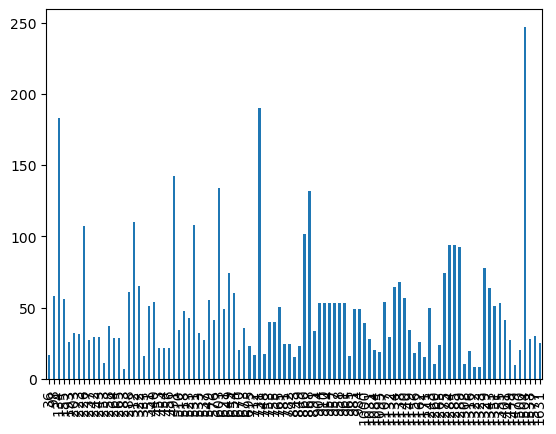

In [21]:
example1.loc[:,"reachable_leaves"].plot(kind="bar")

We can notice that for certain distances, the "with successors" method does not gather more reachable leaves because of the sharing coefficient.

In [22]:
# for one fruit : how many GU needed to reach all the GU ?
distance = [i for i in range (0, 50)]
fruit_results = [get_var_fruit_growth(tree, i, sunlit_fraction_df)[1][16] for i in distance] #fruit borne by GU 288

C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.

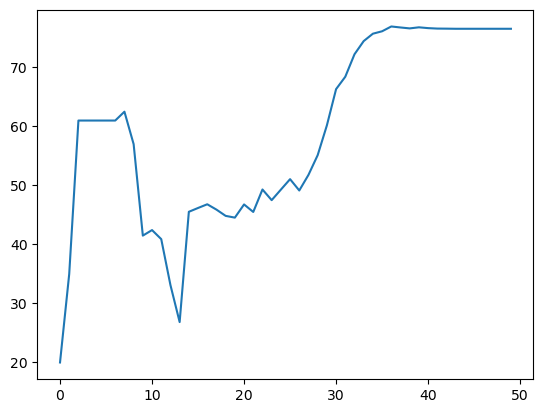

In [23]:
plt.plot(distance, fruit_results)

In [24]:
# for one fruit : how many GU needed to reach all the GU ?
distance = [i for i in range (0, 50)]
leaf_results = [get_var_fruit_growth(tree, i, sunlit_fraction_df)[0][16] for i in distance] #leaves borne by GU 288

C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.

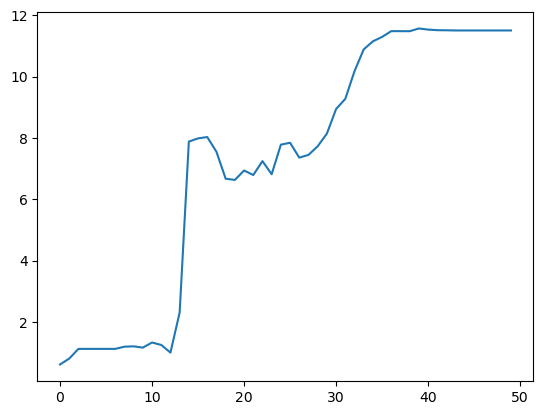

In [25]:
plt.plot(distance, leaf_results)

In [26]:
# collecting variables at the distance dmax :
results = [get_var_fruit_growth(tree, i, sunlit_fraction_df, with_successors=False, aggregate=False) for i in range (0, dmax+1)]

# results are fitted into a dataframe :
col_names = pd.MultiIndex.from_product(([i for i in range(0, dmax+1)],["available_carbon", "reachable_leaves", "reachable_fruits","LF"]), names=["distance","variable"])
final_table = pd.DataFrame(np.transpose(np.vstack(results)), index=np.flatnonzero(tree["arch_dev__pot_nb_fruit"]>0), columns=col_names)
final_table = final_table.swaplevel("distance","variable",1).sort_index(axis=1,level="variable")

final_table["GU_type"] = tree.loc[tree['arch_dev__pot_nb_fruit'] >0]['type']
final_table["dist_to_undef"] = table_dist_to_undef
final_table["fruit_fresh_mass"] = fruit_mass
final_table = np.transpose(final_table)


C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:105: RuntimeWarning: divide by zero encountered in true_divide
  LF = available_carbon / sum_reachable_fruits
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:105: RuntimeWarning: invalid value encountered in true_divide
  LF = available_carbon / sum_reachable_fruits
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:95: RuntimeWarning: divide by zero encountered in true_divide
  leaf_fruit_sharing_fraction = 1/ leaf_fruit_sharing_fraction
C:\Users\bolot\AppData\Local\Temp\ipykernel_1008\2075024072.py:105: RuntimeWarning: divide 

In [27]:
# filtering the lines biased by the undefined structures mentionned above :
final_table.drop(labels = [i for i in final_table.columns if np.any(final_table.loc["GU_type", i]!="GU")], axis=1, inplace=True)
final_table.drop(labels = [i for i in final_table.columns if np.any(final_table.loc["dist_to_undef", i] != np.Inf)], axis=1,inplace=True) # /!\ if dmax np.max(table_dist_to_undef), no line left

# table ready to be exported as a csv file
final_table

36        98        155        440        453   \
variable         distance                                                       
LF               0         0.288875  1.996781  0.649063   1.339635   1.256958   
                 1              NaN       inf       inf        inf        inf   
                 2              inf       inf       inf        inf   3.666129   
                 3              NaN       NaN       inf        inf        inf   
                 4              inf       NaN       inf        inf   0.527944   
                 5              inf       inf       inf        NaN        NaN   
                 6              inf       inf       inf        NaN        inf   
                 7              inf       inf       NaN        inf        inf   
                 8              inf       inf       inf        inf        inf   
                 9              inf       inf       NaN        inf        inf   
                 10             inf       inf       NaN   4.850047   2.438529   
available_carbon 0         0.288875  1.996781  0.649063   1.339635   1.256958   
                 1              0.0   0.62725   2.59625   0.449531   0.628479   
                 2         0.399237  5.141656  1.947188   1.182031   7.332257   
                 3              0.0       0.0  0.966667   0.321094   0.116167   
                 4         0.433313       0.0     0.725   0.642188   0.527944   
                 5          0.27586  0.563909  1.323073        0.0        0.0   
                 6         2.239219  1.374635  0.510187        0.0   0.031167   
                 7          0.77951     1.994       0.0   1.363469   0.342833   
                 8            0.176  1.328781  0.239437   4.561589   0.373663   
                 9         0.211063  1.143573       0.0   4.003663   0.869582   
                 10        2.216156  1.975813       0.0  19.400188   2.438529   
reachable_fruits 0              1.0       1.0       1.0        1.0        1.0   
                 1              0.0       0.0       0.0        0.0        0.0   
                 2              0.0       0.0       0.0        0.0        2.0   
                 3              0.0       0.0       0.0        0.0        0.0   
                 4              0.0       0.0       0.0        0.0        1.0   
                 5              0.0       0.0       0.0        0.0        0.0   
                 6              0.0       0.0       0.0        0.0        0.0   
                 7              0.0       0.0       0.0        0.0        0.0   
                 8              0.0       0.0       0.0        0.0        0.0   
                 9              0.0       0.0       0.0        0.0        0.0   
                 10             0.0       0.0       0.0        4.0        1.0   
reachable_leaves 0              4.0       9.0       3.0       17.0        4.0   
                 1              0.0      13.0      12.0        7.0        2.0   
                 2              3.0      31.0       9.0       15.0  23.333333   
                 3              0.0       0.0       8.0        5.0        1.5   
                 4              6.0       0.0       6.0       10.0   7.833333   
                 5              4.0       5.0      18.0        0.0        0.0   
                 6             29.0      17.0      12.0        0.0       0.25   
                 7             12.0      28.0       0.0       21.0       2.75   
                 8              3.0      21.0       6.0       16.8       3.55   
                 9              2.0      16.0       0.0       28.4      14.65   
                 10            21.0      19.0       0.0       93.0      21.25   
GU_type                          GU        GU        GU         GU         GU   
dist_to_undef                   inf       inf       inf        inf        inf   
fruit_fresh_mass             573.76    397.77    484.21      351.0      342.0   

                                454       456        510     

In [54]:
final_table.loc[pd.IndexSlice[:,3],:]

,,36,98,155,440,453,454,456,510,518,523,...,1275,1343,1351,1355,1401,1449,1479,1538,1577,1631
variable,distance,,,,,,,,,,,,,,,,,,,,,
LF,3,NaN,NaN,inf,inf,inf,inf,inf,inf,inf,NaN,...,inf,inf,inf,inf,inf,NaN,NaN,inf,NaN,NaN
available_carbon,3,0.0,0.0,0.966667,0.321094,0.116167,0.116167,1.947771,2.746552,3.114687,0.0,...,2.938688,7.485643,0.415601,2.552976,0.538625,0.0,0.0,0.11701,0.0,0.0
reachable_fruits,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
reachable_leaves,3,0.0,0.0,8.0,5.0,1.5,1.5,6.5,7.0,10.0,0.0,...,21.0,26.333333,2.333333,14.333333,3.0,0.0,0.0,1.0,0.0,0.0


In [29]:
from math import ceil

array([[<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],


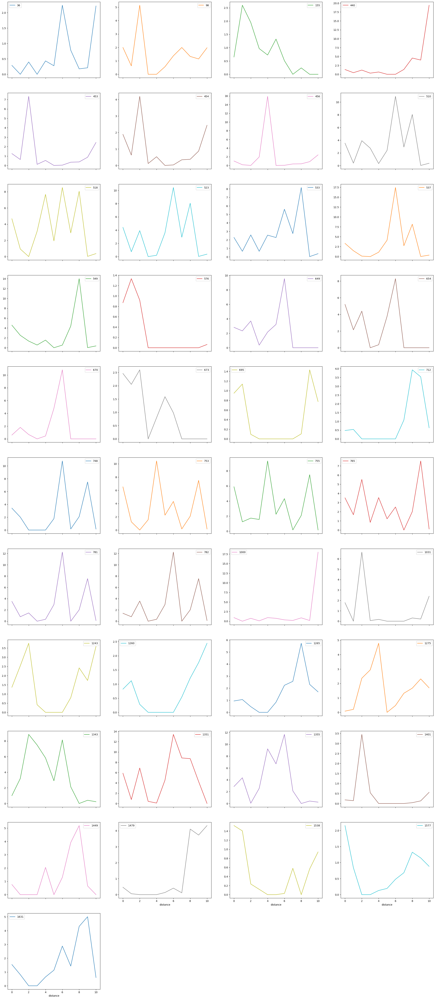

In [30]:
# evolution of carbon production with the distance to the fruit
final_table.loc["available_carbon"].plot(subplots=True, figsize=(30,70), layout=(ceil(len(final_table.columns)/4), 4))

array([[<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],
       [<Axes: xlabel='distance'>, <Axes: xlabel='distance'>,
        <Axes: xlabel='distance'>, <Axes: xlabel='distance'>],


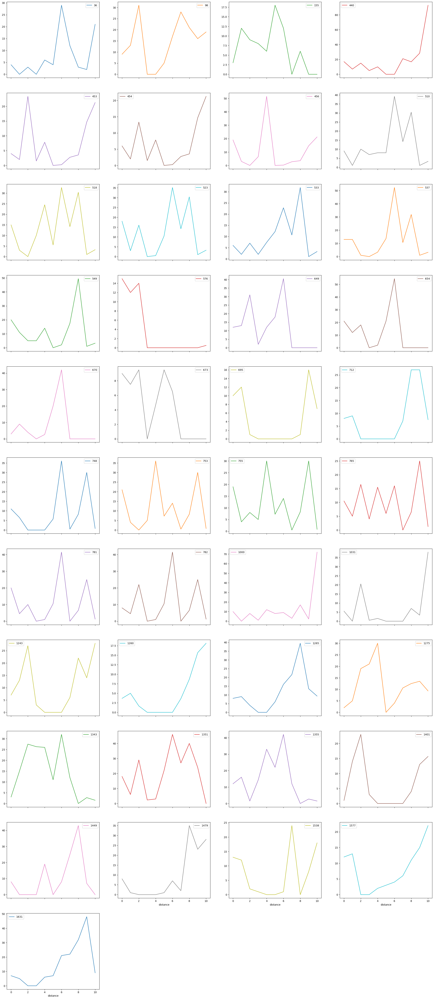

In [31]:
# evolution of reachable leaves with the distance to the fruit
final_table.loc["reachable_leaves"].plot(subplots=True, figsize=(30,70), layout=(ceil(len(final_table.columns)/4), 4))

In [32]:
with resources.path('vmlab.data.results', 'exploration_E13_fruting_season_with_successors.csv') as path:
# with resources.path('vmlab.data.results', 'exploration_E13_fruting_season_exact.csv') as path:
# with resources.path('vmlab.data.results', 'exploration_E13_fruting_season.csv') as path:

# with resources.path('vmlab.data.results', 'exploration_G3.csv') as path:
# with resources.path('vmlab.data.results', 'exploration_E16.csv') as path:
    np.transpose(final_table.swaplevel("variable","distance",0) .sort_index(axis=0,level="distance")).to_csv(path_or_buf= path)

In [33]:
col_names.get_level_values("distance")

Index([ 0,  0,  0,  0,  1,  1,  1,  1,  2,  2,  2,  2,  3,  3,  3,  3,  4,  4,
        4,  4,  5,  5,  5,  5,  6,  6,  6,  6,  7,  7,  7,  7,  8,  8,  8,  8,
        9,  9,  9,  9, 10, 10, 10, 10],
      dtype='int64', name='distance')

In [34]:
col_names.get_level_values("variable")

Index(['available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF',
       'available_carbon', 'reachable_leaves', 'reachable_fruits', 'LF'],
      dtype='object', name='variable')

## Further researches on the tree

Since results were not very clear after plotting the variables on R, further researches are led.

### Fruit mass

In [35]:
fruit_mass.sort_values("MF_recolte_fruit")

,MF_recolte_fruit
id_UC,
1243.0,77.00
258.0,139.00
1162.0,242.00
1284.0,287.00
695.0,301.00
...,...
531.0,520.00
654.0,520.00
603.0,542.00


In [36]:
fruit_mass.describe()

,MF_recolte_fruit
count,93.000000
mean,408.578095
std,71.187923
min,77.000000
25%,383.000000
50%,408.760000
75%,449.000000
max,573.760000


<Axes: xlabel='Masse du fruit (g)', ylabel='nombre de fruits'>

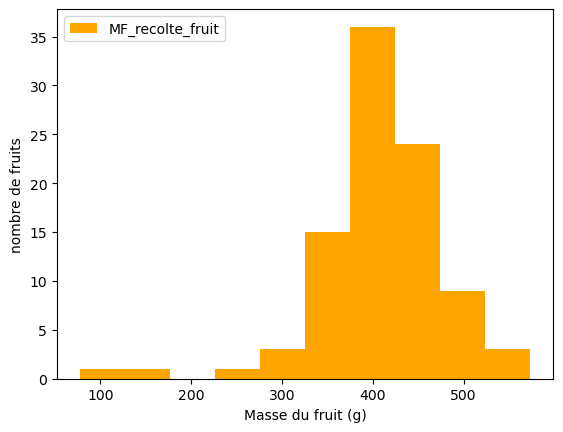

In [37]:
fruit_mass.plot(kind="hist", ylabel = "nombre de fruits", xlabel="Masse du fruit (g)", color="orange")

Branches are created from each fruit, and are defined as the group of GU at the d distance of this fruit. Dupplicates are droped, and non proper grotwh units (branch, branch empty...) are removed as well.

In [38]:
def collect_branches (tree, dmax, drop_dupplicate = False):
    graph = vmlab.to_graph(tree)
    adjacency = np.array(graph.get_adjacency())
    is_fruting = (tree['arch_dev__pot_nb_fruit'] > 0)

    # Initializaton
    distance_to_fruit = np.array([], dtype=np.float32)
    is_in_distance_to_fruit = np.array([], dtype=bool)

    # Collecting GUs (fruit GU included)
    if np.any(is_fruting) : 
        distance_to_fruit = csgraph.shortest_path( 
                                    adjacency,
                                    indices=np.flatnonzero(is_fruting),
                                    directed=False
                                ).astype(np.float32)

        distance_to_fruit[distance_to_fruit > dmax] = np.inf #collecting GU under a dmax distance
        is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32) 
        is_in_distance_to_fruit[is_in_distance_to_fruit==0] = np.nan

        fruit_mass_of_reachable_GU = pd.DataFrame(np.copy(is_in_distance_to_fruit).astype(float), index=np.flatnonzero(is_fruting))
        
    for i in range (0, graph.ecount()):
        if i in fruit_mass.index:
            fruit_mass_of_reachable_GU.loc[fruit_mass_of_reachable_GU[i]==1,i] = fruit_mass.loc[i,"MF_recolte_fruit"]
    fruit_mass_of_reachable_GU[fruit_mass_of_reachable_GU==1] = np.nan
    fruit_mass_of_reachable_GU["type"] = tree.loc[tree['arch_dev__pot_nb_fruit'] >0]['type']
    if drop_dupplicate == True :
        fruit_mass_of_reachable_GU.drop_duplicates(inplace=True, keep="first")
    fruit_mass_of_reachable_GU.drop(labels = [i for i in fruit_mass_of_reachable_GU.index if i not in fruit_mass.index], inplace=True)
    #fruit_mass_of_reachable_GU.drop(labels = [i for i in fruit_mass_of_reachable_GU.index if fruit_mass_of_reachable_GU.loc[i, "type"]!="GU"], inplace=True)
    fruit_mass_of_reachable_GU.drop(columns="type", inplace=True)

    return np.transpose(fruit_mass_of_reachable_GU)

In [39]:
test = collect_branches(tree, 10)

In [40]:
test

,36,98,134,155,193,203,223,226,237,242,...,1323,1329,1343,1351,1355,1401,1479,1538,1577,1631
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1694,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1695,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


36         Axes(0.125,0.11;0.00695691x0.77)
98      Axes(0.133348,0.11;0.00695691x0.77)
134     Axes(0.141697,0.11;0.00695691x0.77)
155     Axes(0.150045,0.11;0.00695691x0.77)
193     Axes(0.158393,0.11;0.00695691x0.77)
                       ...                 
1401     Axes(0.85965,0.11;0.00695691x0.77)
1479    Axes(0.867998,0.11;0.00695691x0.77)
1538    Axes(0.876346,0.11;0.00695691x0.77)
1577    Axes(0.884695,0.11;0.00695691x0.77)
1631    Axes(0.893043,0.11;0.00695691x0.77)
Length: 93, dtype: object

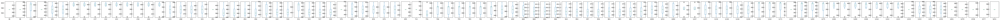

In [41]:
test.plot(kind="box", subplots=True, figsize=(120,2))

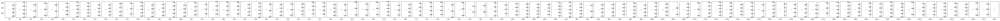

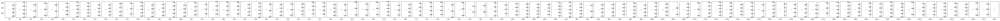

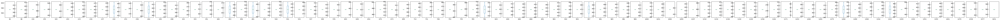

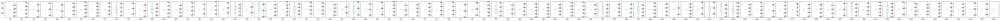

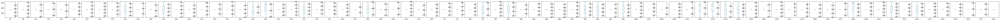

...

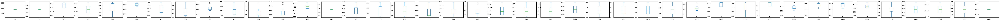

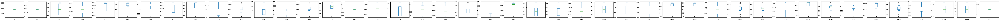

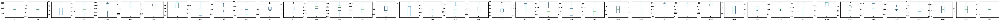

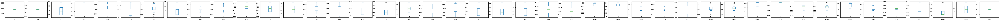

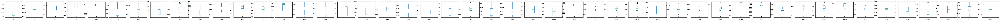

In [42]:
for branch_size in range (0, 20):
    test = collect_branches(tree, branch_size, drop_dupplicate= True)
    test.plot(kind="box", subplots=True, figsize=(120,2))

/!\ On ne peut accéder à une branche que par le plus petit fruit contenu dans cette branche si on supprime les doublons

In [43]:
test = pd.DataFrame(collect_branches(tree, 7).std())

In [44]:
graph.ecount()

1697

In [45]:
from_tree = pd.DataFrame([collect_branches(tree, i, drop_dupplicate=True).std() for i in range (45,0,-1)], index = [i for i in range (45,0,-1)] ) 

In [46]:
from_tree["mean deviation"] = np.mean(from_tree, axis=1)

In [47]:
from_tree

,36,134,1132,649,1351,440,1343,155,98,1316,...,957,1355,243,265,454,782,958,1285,1323,mean deviation
45,71.187923,71.187923,71.187923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.187923
44,71.187923,71.187923,71.187923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.187923
43,71.187923,71.187923,71.187923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.187923
42,71.187923,71.187923,71.187923,71.561346,71.190274,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.263078
41,71.187923,71.187923,71.187923,71.561346,71.190274,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.263078
40,71.187923,71.187923,71.187923,71.947406,72.481906,71.561346,71.190274,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.534957
39,71.187923,71.187923,71.187923,71.947406,73.079841,NaN,71.190274,71.561346,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.620377
38,71.187923,71.187923,71.187923,72.633733,74.919664,71.947406,72.481906,NaN,71.561346,71.190274,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.033122
37,71.187923,71.187923,71.187923,75.203267,76.022561,71.946336,73.079841,71.947406,71.561346,71.190274,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.372868
36,71.187923,71.187923,71.187923,65.555593,78.233822,72.659928,74.919664,71.946336,71.947406,72.481906,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.053367


<Axes: title={'center': 'Moyenne des écarts types des masses de fruits des branches formées par chaque distance d'}, xlabel="longueur de la branche (en nombre d'UC)", ylabel='Moyenne des écarts types'>

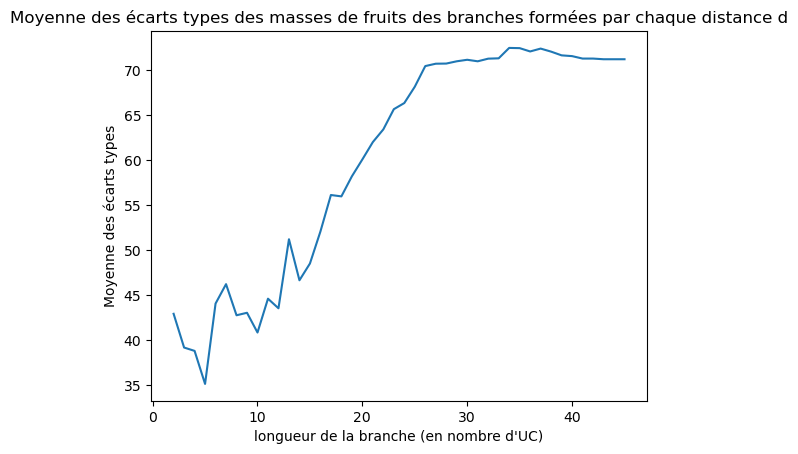

In [48]:
from_tree["mean deviation"].plot(title = "Moyenne des écarts types des masses de fruits des branches formées par chaque distance d", xlabel="longueur de la branche (en nombre d'UC)", ylabel="Moyenne des écarts types")

L'écart type moyen entre les masses des fruits est minimal pour d = 3 la longueur de la branche. Quand les branches se supperposent potentiellement, et ne tiennent pas compte du "type".

L'écart type moyen entre les masses des fruits est minimal pour d = 5 quand on supprime les doublons.

In [49]:
from_tree[from_tree["mean deviation"] == np.min(from_tree["mean deviation"])].index

Index([5], dtype='int64')

array([<Axes: title={'center': '36'}>, <Axes: title={'center': '134'}>,
       <Axes: title={'center': '1132'}>, <Axes: title={'center': '649'}>,
       <Axes: title={'center': '1351'}>, <Axes: title={'center': '440'}>,
       <Axes: title={'center': '1343'}>, <Axes: title={'center': '155'}>,
       <Axes: title={'center': '98'}>, <Axes: title={'center': '1316'}>,
       <Axes: title={'center': '1000'}>, <Axes: title={'center': '253'}>,
       <Axes: title={'center': '712'}>, <Axes: title={'center': '1243'}>,
       <Axes: title={'center': '510'}>, <Axes: title={'center': '531'}>,
       <Axes: title={'center': '1095'}>, <Axes: title={'center': '1322'}>,
       <Axes: title={'center': '1401'}>, <Axes: title={'center': '576'}>,
       <Axes: title={'center': '843'}>, <Axes: title={'center': '954'}>,
       <Axes: title={'center': '1084'}>, <Axes: title={'center': '1260'}>,
       <Axes: title={'center': '1631'}>, <Axes: title={'center': '849'}>,
       <Axes: title={'center': '868'}>, <

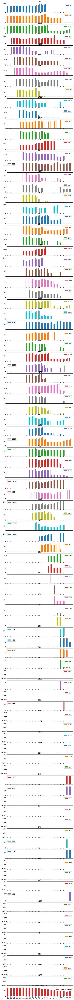

In [50]:
from_tree.plot(subplots=True, kind="bar", figsize=(8,120))

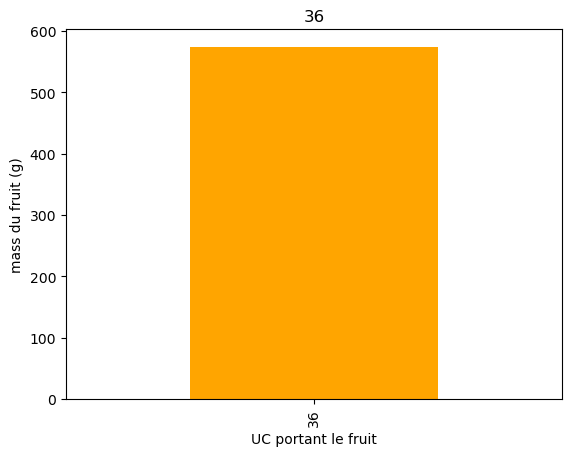

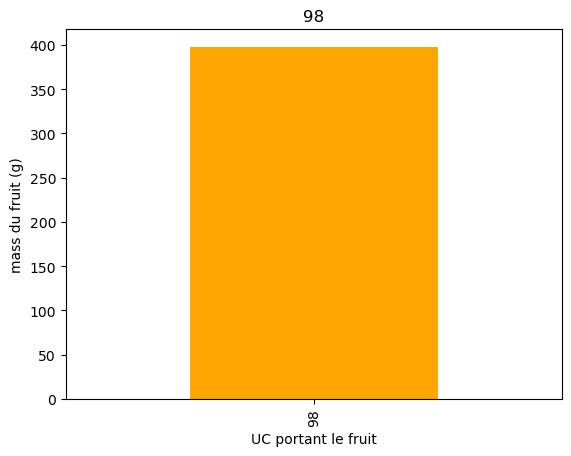

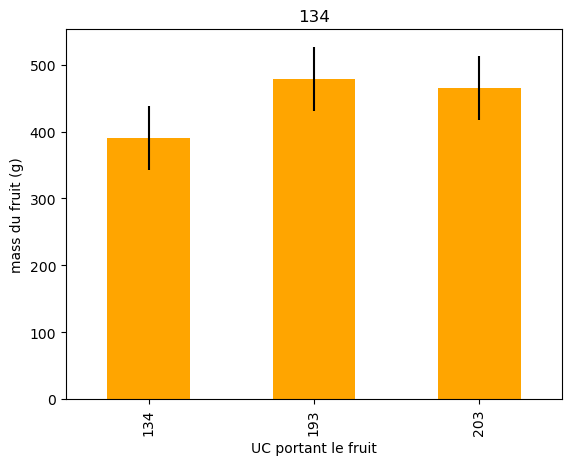

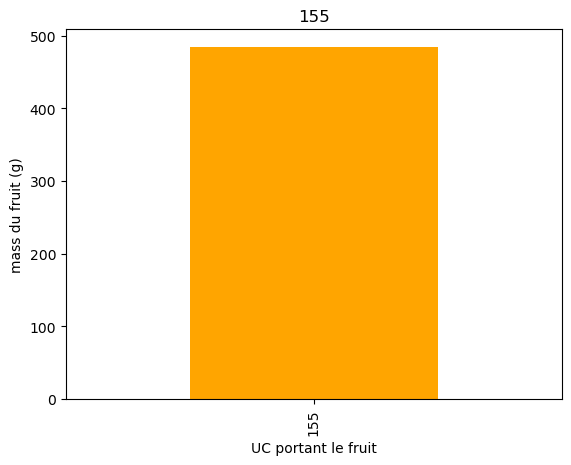

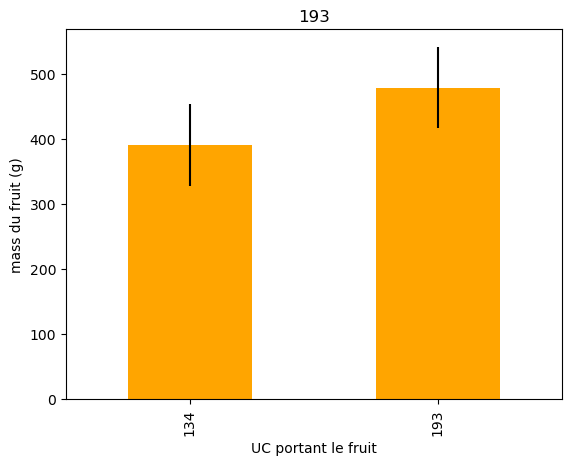

...

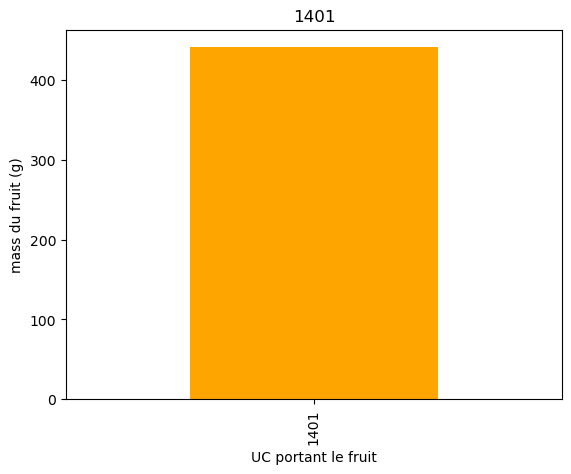

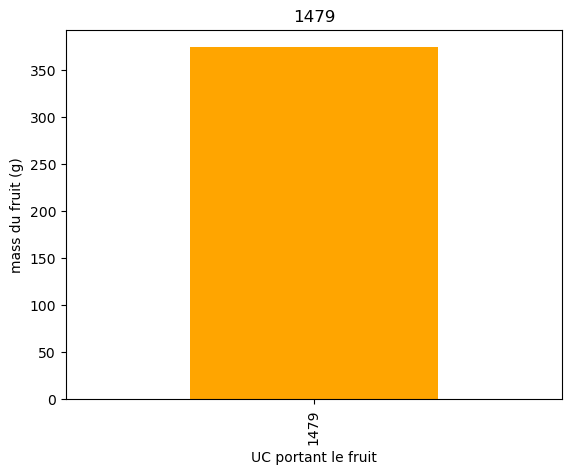

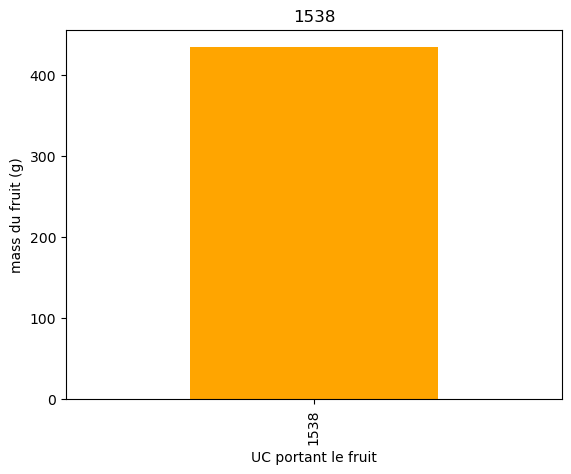

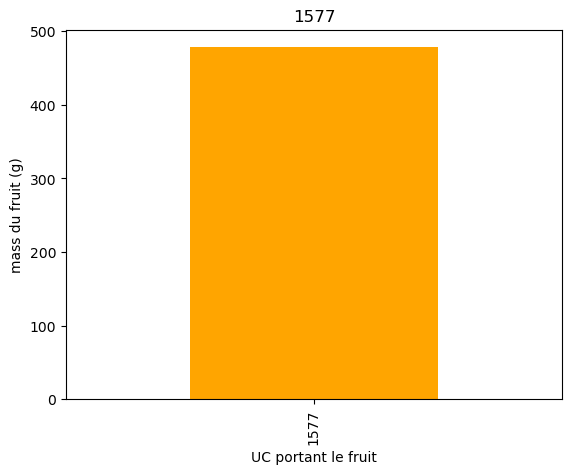

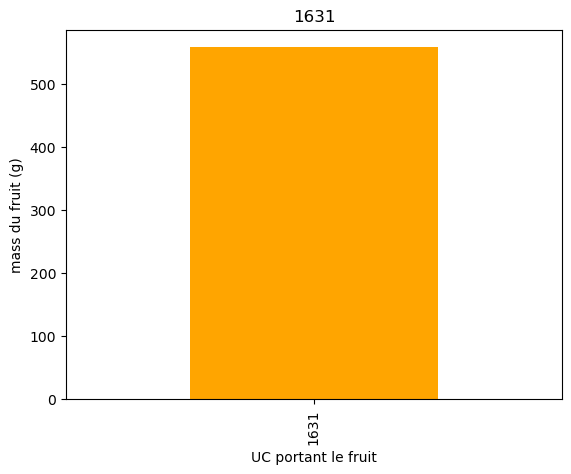

In [51]:
table = collect_branches(tree, 10)
for fruit in table.columns :
    selected_GU = table[fruit]
    selected_GU = pd.DataFrame(selected_GU[pd.notna(selected_GU)])
    selected_GU["standard deviation"] = np.full(fill_value=selected_GU.std(), shape = len(selected_GU))
    #print(selected_GU)
    plt.show(selected_GU[fruit].plot(kind="bar",title=fruit, xlabel="UC portant le fruit", ylabel="mass du fruit (g)", color="orange", yerr=selected_GU["standard deviation"]))

### Light environment

Evolution of the light environment according to the (exact) distance from the fruit :

In [52]:
for UC in final_table.index :
    plt.show(final_table.loc[UC, 'lit_env'].plot.bar(title=UC, xlabel="distance to fruit", ylabel="light environment", color="skyblue"))

KeyError: 'lit_env'

### Number of GUs

Number of GUs according to the distance from the fruit :

In [17]:
def get_number_of_GU_in_distance_to_fruit(tree, dmax, method = "exact"):
    graph = vmlab.to_graph(tree)
    adjacency = np.array(graph.get_adjacency())
    is_fruting = (tree['arch_dev__pot_nb_fruit'] > 0)

    # GU in distance
    if np.any(is_fruting) : 
        distance_to_fruit = csgraph.shortest_path( 
                                    adjacency,
                                    indices=np.flatnonzero(tree["arch_dev__pot_nb_fruit"]>0),
                                    directed=False
                                ).astype(np.float32)
        if method == "exact":
                    distance_to_fruit[distance_to_fruit != dmax] = np.inf #collecting GU at a dmax distance
        else :
                distance_to_fruit[distance_to_fruit > dmax] = np.inf #collecting GU under a dmax distance
        is_in_distance_to_fruit = np.isfinite(distance_to_fruit).astype(np.float32)

    number_of_GU_in_distance_to_fruit = np.nansum(is_in_distance_to_fruit, axis=1)
    return number_of_GU_in_distance_to_fruit

In [287]:
get_number_of_GU_in_distance_to_fruit(tree,10)

array([ 4.,  7., 12.,  2.,  5.,  5., 16., 16., 16., 16., 16.,  9., 26.,
       26., 26.,  9., 10., 11.,  6.,  6.,  4., 16., 14., 14., 14., 35.,
        8.,  8.,  8., 25.,  8.,  8.,  8.,  8., 30., 14.,  7.,  7.,  7.,
        7., 11.,  4., 35.,  4.,  4.,  4.,  5.,  5.,  5.,  6.,  9., 19.,
        8., 11.,  9.,  9., 18., 18., 18., 21., 20., 23.,  7., 14., 14.,
       12., 12., 12.,  3.,  3.,  3.,  3.,  6., 43., 11.,  7., 11., 15.,
        8.,  8.,  3.,  3.,  6.,  8.,  6.,  4.,  4., 20.,  5.,  3.,  5.,
        8.,  3.,  6., 24., 46., 10., 10.,  4.], dtype=float32)

In [18]:
results = [get_number_of_GU_in_distance_to_fruit(tree, i) for i in range (0,dmax+1)]

# table row names : id of the GU bearing the fruit 
final_table = pd.DataFrame(np.transpose(results), index=np.flatnonzero(tree["arch_dev__pot_nb_fruit"]>0), columns=[i for i in range (0, dmax+1)])
final_table

,0,1,2,3,4,5,6,7,8,9,10
36,1.0,1.0,2.0,2.0,5.0,8.0,11.0,4.0,2.0,2.0,4.0
98,1.0,1.0,3.0,1.0,1.0,4.0,4.0,9.0,9.0,7.0,7.0
134,1.0,1.0,2.0,5.0,9.0,8.0,8.0,11.0,8.0,19.0,12.0
155,1.0,1.0,3.0,3.0,5.0,4.0,3.0,2.0,3.0,1.0,2.0
193,1.0,1.0,5.0,1.0,1.0,1.0,1.0,2.0,4.0,5.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...
1500,1.0,1.0,1.0,1.0,1.0,2.0,4.0,7.0,8.0,15.0,24.0
1504,1.0,1.0,4.0,8.0,3.0,6.0,11.0,18.0,23.0,33.0,46.0
1538,1.0,1.0,1.0,1.0,1.0,1.0,2.0,4.0,4.0,9.0,10.0
1577,1.0,1.0,1.0,1.0,2.0,3.0,3.0,5.0,6.0,8.0,10.0


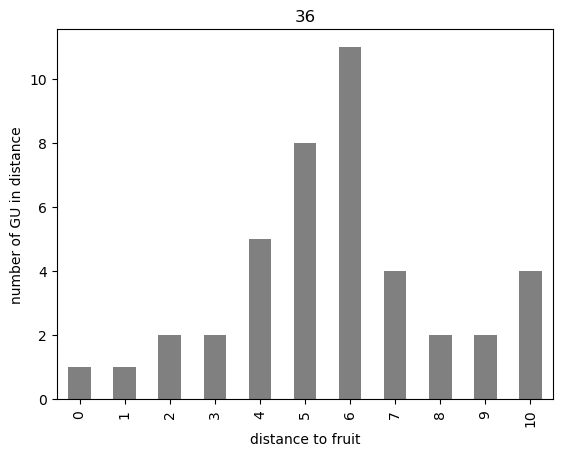

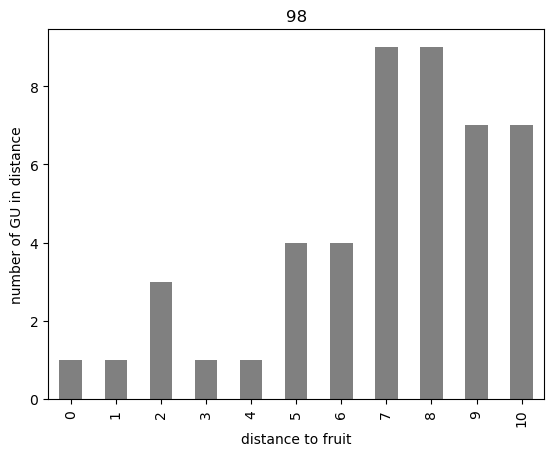

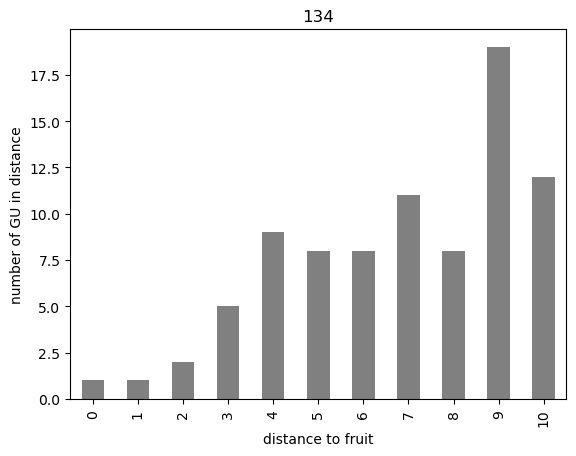

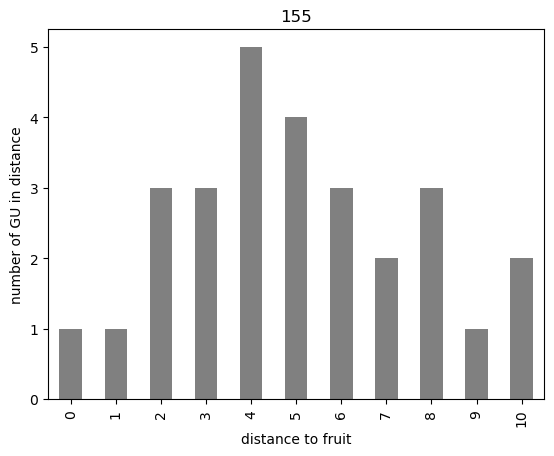

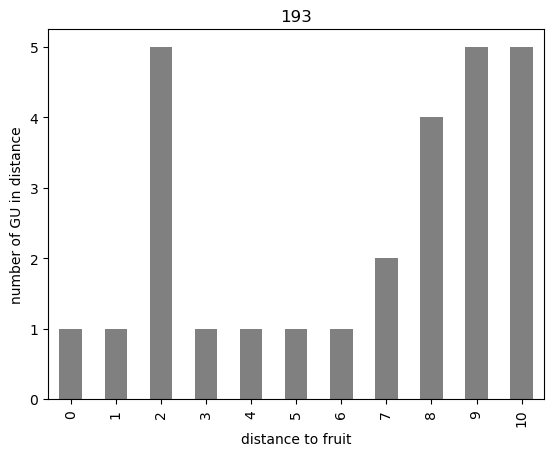

...

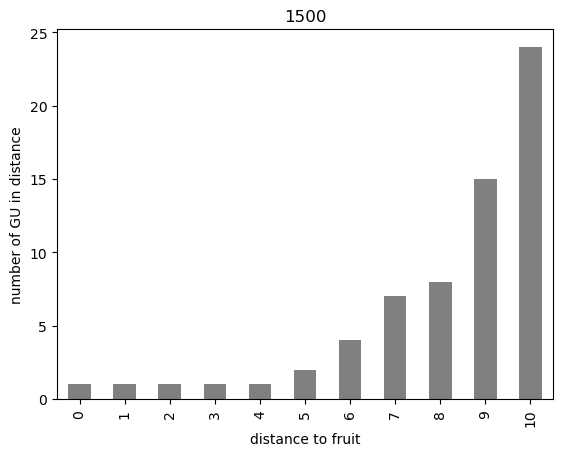

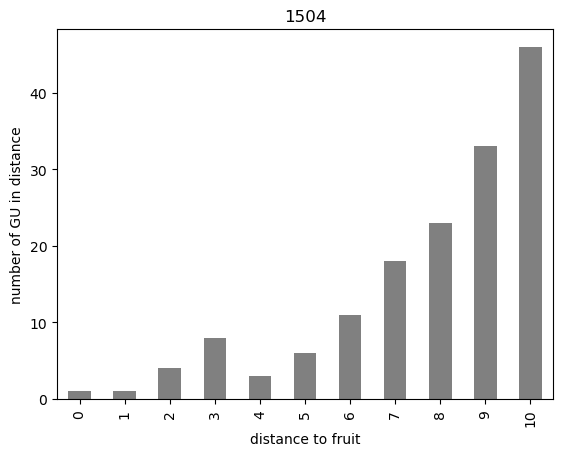

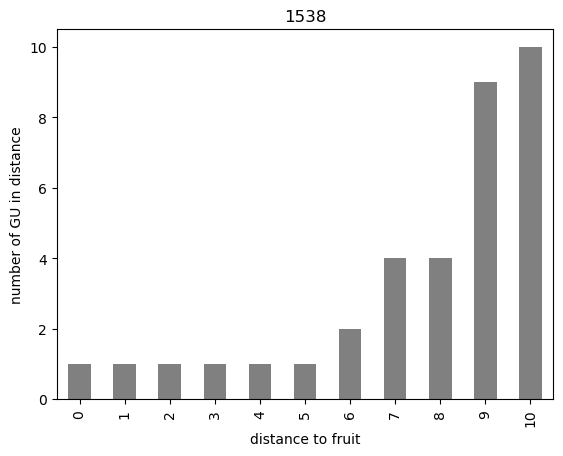

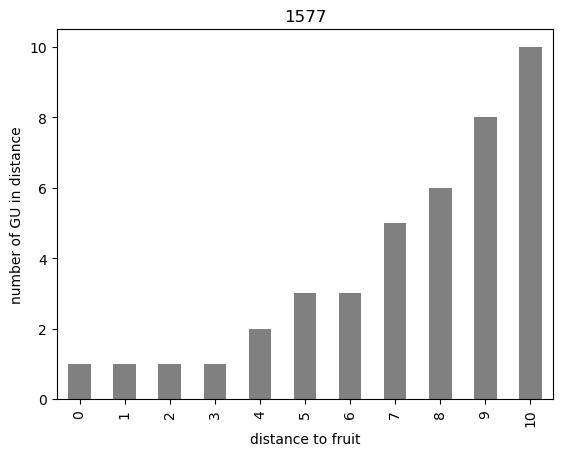

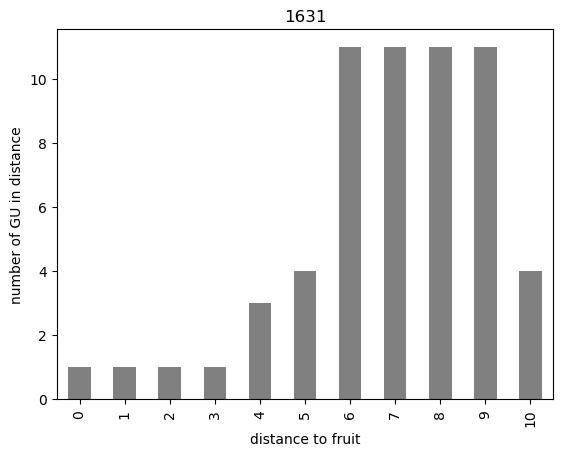

In [19]:
for i in final_table.index :
    plt.show(final_table.loc[i].plot(kind="bar", title=i, xlabel="distance to fruit", ylabel="number of GU in distance", color="grey"))

In [162]:
## more tools

In [11]:
tree.loc[is_in_distance_to_fruit[0]==1,'type'].index

Index([ 4, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28,
       29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
       47, 48, 49, 50, 51, 52],
      dtype='int64')

In [38]:
dist_to_undef[dist_to_undef == 0].stack().index.tolist()

[(2, 134),
 (25, 491),
 (34, 603),
 (42, 731),
 (51, 860),
 (52, 868),
 (56, 954),
 (57, 957),
 (58, 958),
 (59, 961),
 (61, 981),
 (62, 984),
 (71, 1140),
 (80, 1284),
 (81, 1285),
 (82, 1289),
 (87, 1329),
 (95, 1504)]